In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np
import datajoint as dj
import scipy.stats as stats
# dj.config['database.host'] = '127.0.0.1'
# dj.config['database.user'] = 'root'
# dj.config['database.password']= 'simple'

In [3]:
import nwb_datajoint as nd

# ignore datajoint+jupyter async warnings
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)
os.environ['NWB_DATAJOINT_TEMP_DIR']="/stelmo/nwb/tmp"
os.environ['KACHERY_STORAGE_DIR']="/stelmo/nwb/kachery-storage"

Connecting emonroe@lmf-db.cin.ucsf.edu:3306


In [4]:
from nwb_datajoint.common import (RawPosition, HeadDir, Speed, LinPos, StateScriptFile, VideoFile,
                                  DataAcquisitionDevice, CameraDevice, Probe,
                                  DIOEvents,
                                  ElectrodeGroup, Electrode, Raw, SampleCount,
                                  LFPSelection, LFP, LFPBandSelection, LFPBand,
                                  SortGroup, SpikeSortingFilterParameters, SpikeSortingArtifactDetectionParameters,
                                  SpikeSortingRecordingSelection, SpikeSortingRecording, 
                                  SpikeSortingWorkspace, 
                                  SpikeSorter, SpikeSorterParameters, SortingID,
                                  SpikeSortingSelection, SpikeSorting, 
                                  SpikeSortingMetricParameters,
                                  ModifySortingParameters, ModifySortingSelection, ModifySorting, 
                                  AutomaticCurationParameters, AutomaticCurationSelection,
                                  AutomaticCuration,
                                  CuratedSpikeSortingSelection, CuratedSpikeSorting,
                                  UnitInclusionParameters,
                                  FirFilter,
                                  IntervalList, SortInterval,
                                  Lab, LabMember, LabTeam, Institution,
                                  BrainRegion,
                                  SensorData,
                                  Session, ExperimenterList,
                                  Subject,
                                  Task, TaskEpoch,
                                  Nwbfile, AnalysisNwbfile, NwbfileKachery, AnalysisNwbfileKachery)
import matplotlib.pyplot as plt
import statistics

In [5]:
%store -r shape
%store -r session_data
%store -r data
%store -r dataz
%store -r recording
%store -r ssr_key
%store -r sort_interval_name
%store -r sort_interval
%store -r valid_timestamps
%store -r above_both
%store -r above_z
%store -r above_a
%store -r nelect_above
%store -r half_window_points
%store -r artifact_params
%store -r param_dict

In [6]:
amplitude_thresh = param_dict.get('amplitude_thresh')
zscore_thresh = param_dict.get('zscore_thresh')

/tmp/ipykernel_3021453/1166072064.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


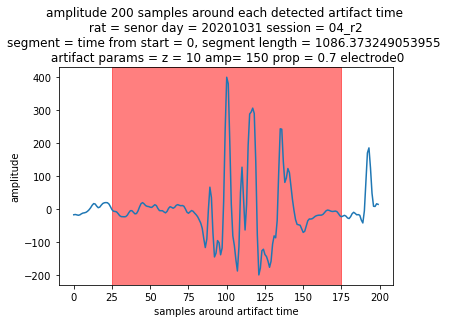

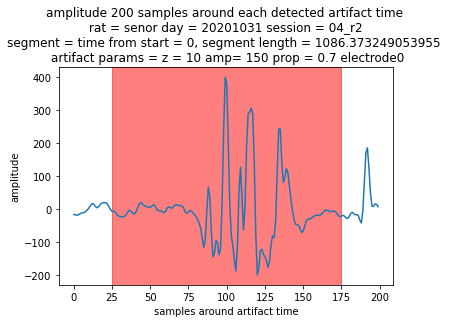

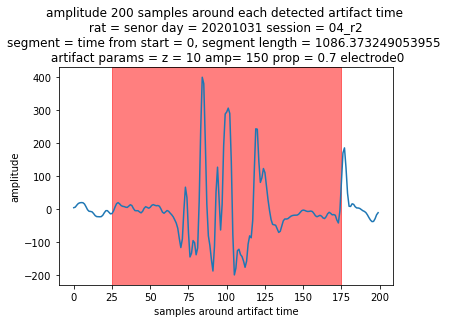

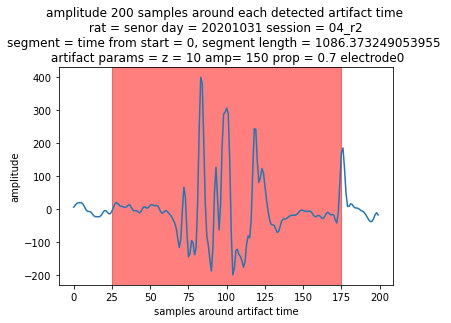

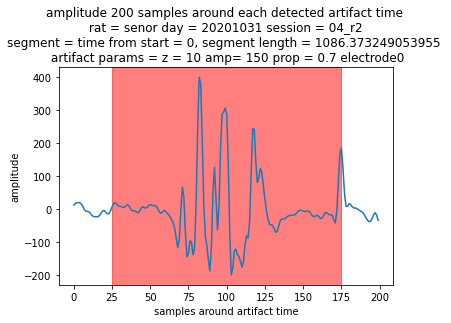

...

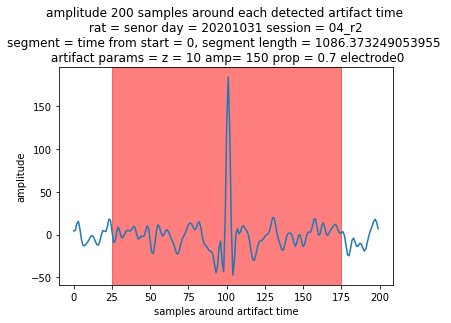

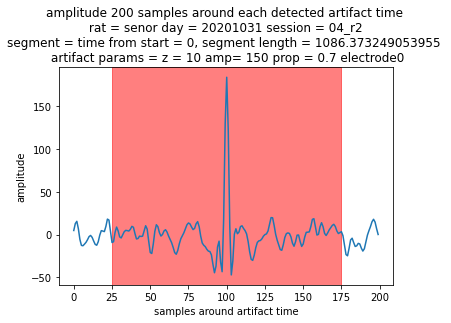

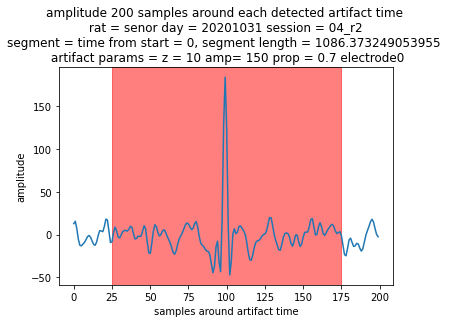

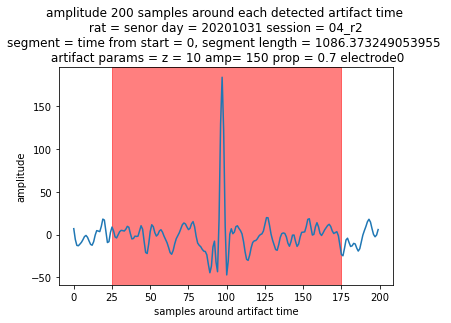

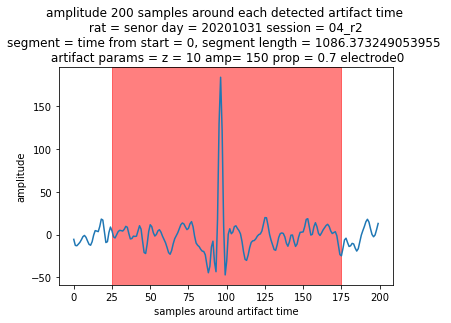

In [7]:
#This will plot all artifacts on 1 electrode

electrode = 0 
center = 100
for ix in range(len(above_both)):
    #plt the 100 points on either side of the artifact
    plt.figure()
    data_sample = data[electrode,(above_both[ix]-center):(above_both[ix]+center)]
    plt.plot(data_sample)
    plt.xlabel('samples around artifact time')
    plt.ylabel('amplitude')
    plt.title(f'amplitude 200 samples around each detected artifact time \n {session_data} \n {artifact_params} electrode{electrode}')
    art_start=center-half_window_points
    art_end=center+half_window_points
    plt.axvspan(art_start,art_end, color='red', alpha=0.5)

#time window rather than sample will be useful! How long is a spike? (x axis labeling- seconds before and after) 
#average across electrodes
#some spread around the avg? what part of the artifact is similar?
#average with standard eroor around it! 

In [ ]:
#This will plot one artifact across all electrodes
artifact = 0
center =100
for ix in range(int(data.shape[0]/2)):
    #plt the 100 points on either side of the artifact
    plt.figure()
    data_sample = data[ix,(above_both[artifact]-center):(above_both[artifact]+center)]
    plt.plot(data_sample)
    plt.xlabel('samples areound artifact time')
    plt.hlines(amplitude_thresh,0,len(data_sample))
    plt.ylabel('amplitude')
    art_start=center-half_window_points
    art_end=center+half_window_points
    plt.axvspan(art_start,art_end, color='red', alpha=0.5)
    plt.title(f'amplitude {center*2} seconds around 1 artifact time on each electrode \n {session_data} \n{artifact_params}\nelectrode{ix}, artifact sample = {above_both[artifact]}')

In [11]:
#look at events that crossed threshold on 1 electrode but not overall,
#useful for seeing if thresholds should be altered

In [8]:
electrode = 0
above_a1= data[electrode]>=amplitude_thresh
above_z1=dataz[electrode]>=zscore_thresh
above_both1 = np.ravel(np.argwhere(np.logical_and(above_z1, above_a1)))

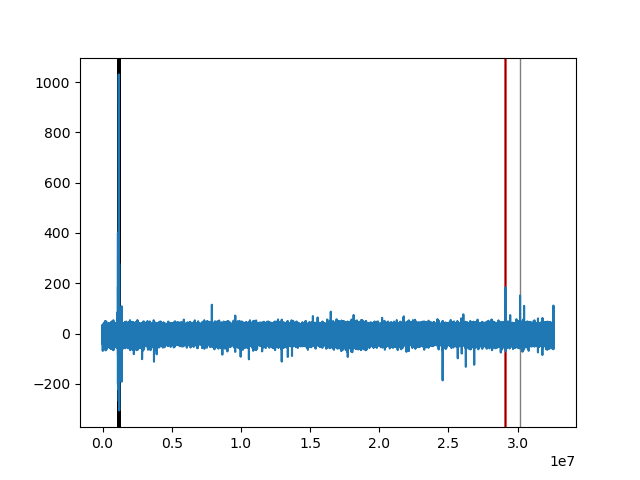

In [9]:
%matplotlib widget
plt.plot(data[electrode])
for a in above_both:
    plt.axvspan(int(a - half_window_points),int(a + half_window_points), color='red', alpha=0.7)
for a in above_both1:
    plt.axvspan(int(a - half_window_points),int(a + half_window_points), color='black', alpha=0.5)
#Z score space!!! 
#lower prioirty- come back to something like this later

In [10]:
#find events detected on 1st electrode, but not overall
on1_not_all = list(set(above_both1) - set(above_both)) 

In [11]:
#find events detected overall that were not detected on electrode 0
on_all_not1=list(set(above_both) - set(above_both1))

/tmp/ipykernel_3021453/1217864836.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


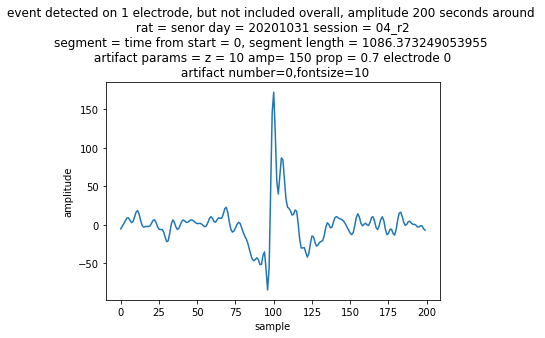

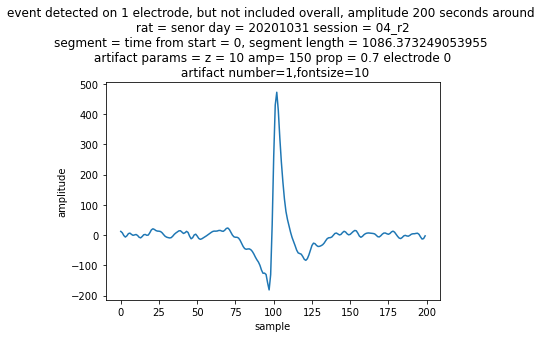

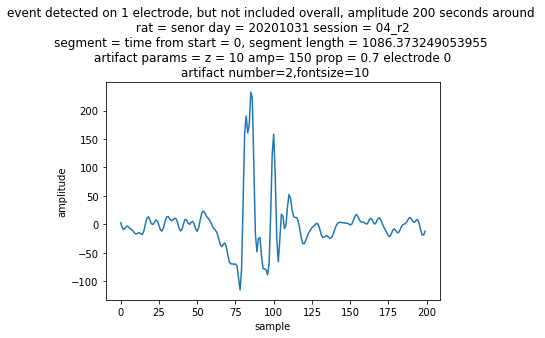

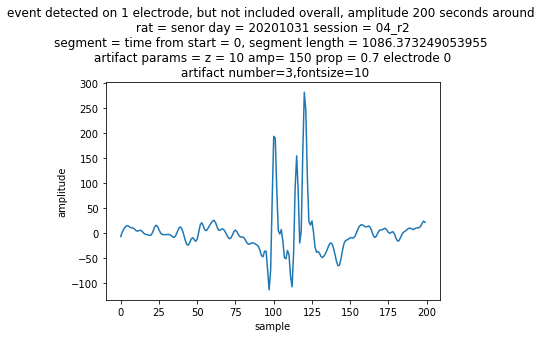

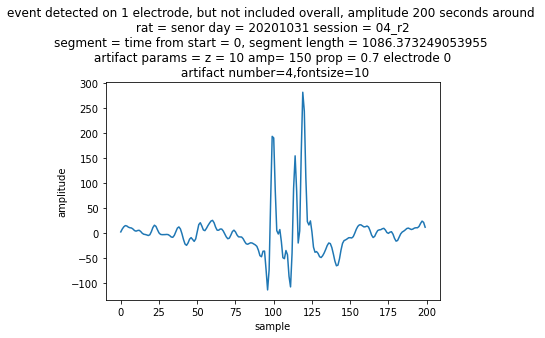

...

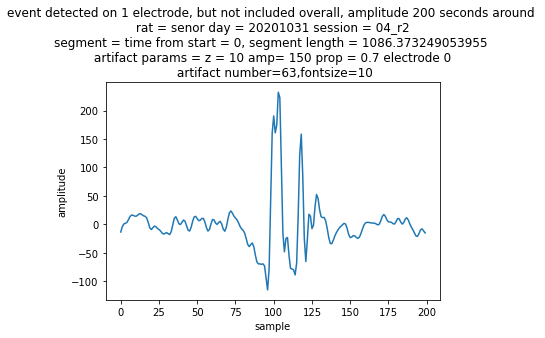

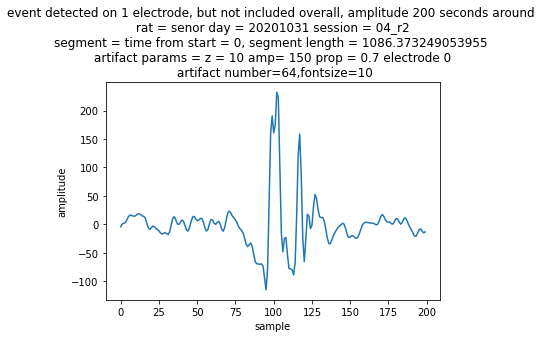

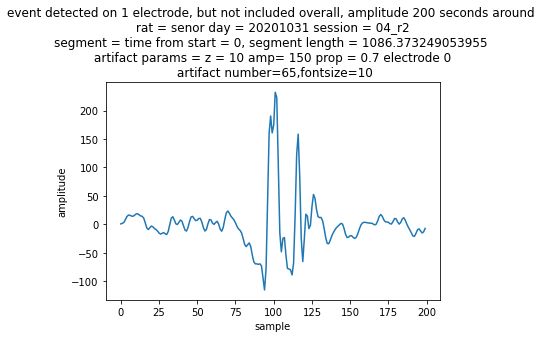

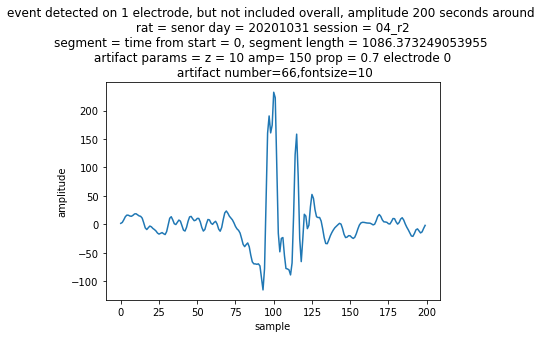

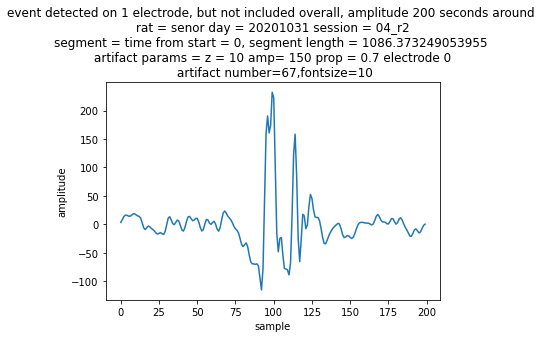

In [12]:
#plt all events detected on electrode 0 that were not included overall (look pretty artifact-y)
%matplotlib inline
for ix in range(len(on1_not_all)):
    plt.figure()
    data_sample = data[0,(on1_not_all[ix])-100:(on1_not_all[ix])+100]
    plt.plot(data_sample)
    plt.xlabel('sample')
    plt.ylabel('amplitude')
    plt.title(f'event detected on 1 electrode, but not included overall, amplitude 200 seconds around \n {session_data} \n {artifact_params} electrode 0 \n artifact number={ix},fontsize=10')
    # plt.axvspan((data[0,(on1_not_all[ix])]) - half_window_points,(data[0,(on1_not_all[ix])]) + half_window_points, color='red', label='detected artifact times')


In [23]:
on1_not_all

[1261740, 80402, 1644723, 27671, 27672]

In [ ]:
on1_not_all
%matplotlib inline
for ix in range((shape[0])):
    data_sample = data[ix,(on1_not_all[0])-100:(on1_not_all[0])+100]
    plt.figure()
    plt.plot(data_sample)
    plt.ylim(-75,160)
    plt.hlines(amplitude_thresh,0,len(data_sample))
    plt.title(f'artifact detected on 1 electrode, but not overall. what does it look like on the rest? electrode {ix} \n{artifact_params}\n{session_data}')
    plt.xlabel('samples')
    plt.ylabel('amplitude')



In [27]:
for ix in range(len(on_all_not1)):
    plt.figure()
    data_sample = data[0,(on_all_not1[ix])-100:(on_all_not1[ix])+100]
    plt.plot(data_sample)
    plt.xlabel('sample')
    plt.ylabel('amplitude')
    plt.ylim(-50,150)
    plt.title(f'event detected on all. but not on this electrode, amplitude 200 seconds around \n {session_data} \n {artifact_params} electrode 0, artifact {ix}')



Z scores

In [ ]:
#plot z scores around each artifact on electrode 0
electrode = 0 
center= 100
for ix in range(len(above_both)):
    #plt the 100 points on either side of the artifact
    plt.figure()
    data_sample = dataz[electrode,(above_both[ix]-center):(above_both[ix]+center)]
    plt.plot(data_sample)
    plt.xlabel('samples around artifact time')
    plt.ylabel('amplitude')
    plt.title(f'amplitude 200 samples around each detected artifact time \n {session_data} \n {artifact_params} electrode{electrode}')
    art_start=center-half_window_points
    art_end=center+half_window_points
    plt.axvspan(art_start,art_end, color='red', alpha=0.5)

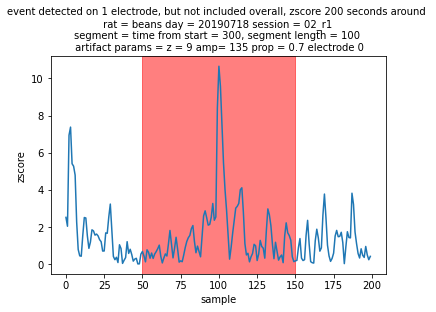

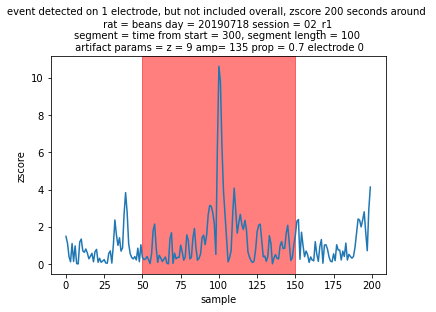

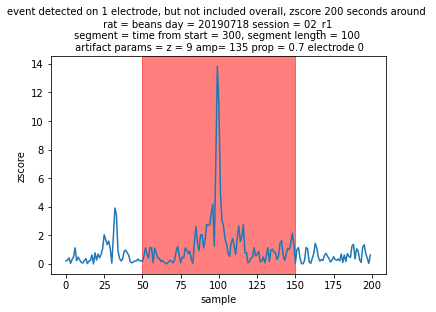

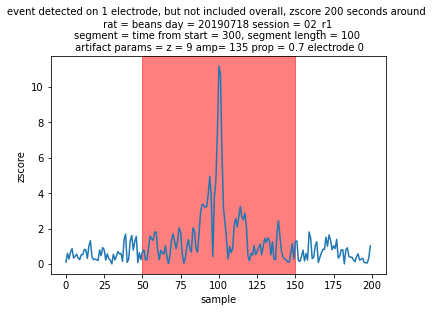

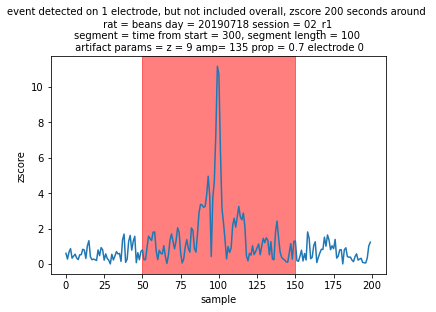

In [85]:
#all events detected on electrode 0 that were not included overall
#just visualizing the events that crossed thresh on electrode 1
%matplotlib inline
center=100
for ix in range(len(on1_not_all)):
    plt.figure()
    data_sample = dataz[0,(on1_not_all[ix])-center:(on1_not_all[ix])+center]
    plt.plot(data_sample)
    plt.xlabel('sample')
    plt.ylabel('zscore')
    plt.title(f'event detected on 1 electrode, but not included overall, zscore 200 seconds around \n {session_data} \n {artifact_params} electrode 0',fontsize=10)
    art_start=center-half_window_points
    art_end=center+half_window_points
    plt.axvspan(art_start,art_end, color='red', alpha=0.5)





/tmp/ipykernel_2720624/3429640712.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


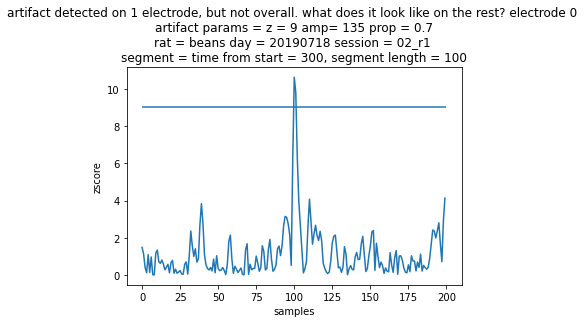

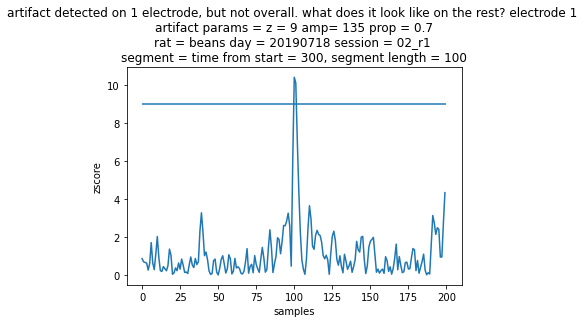

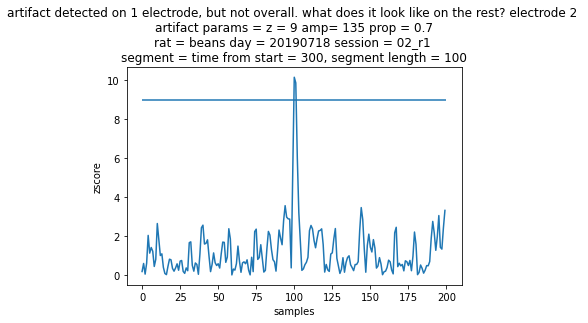

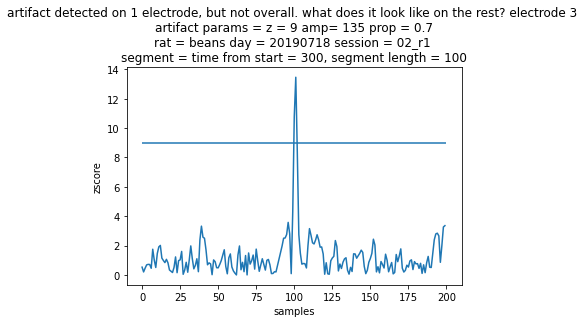

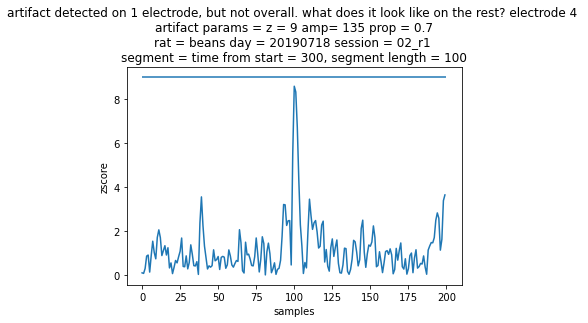

...

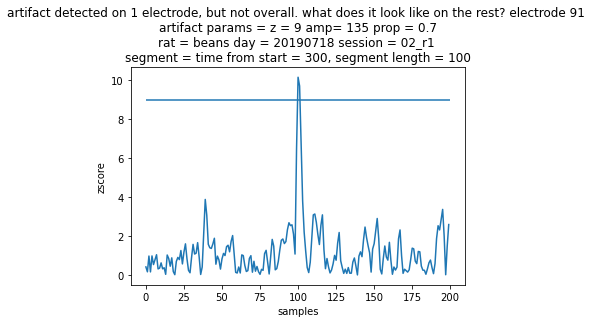

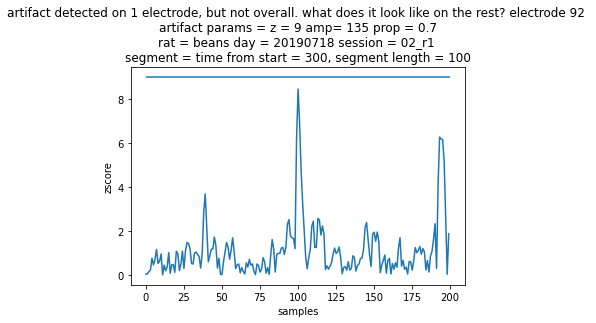

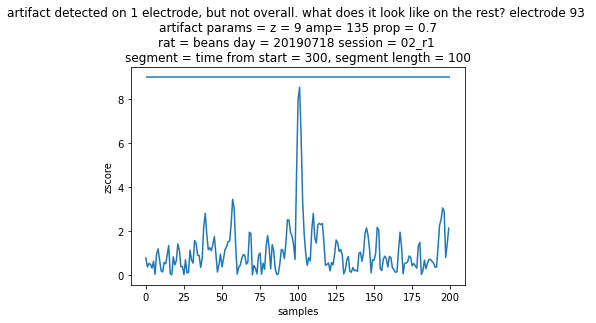

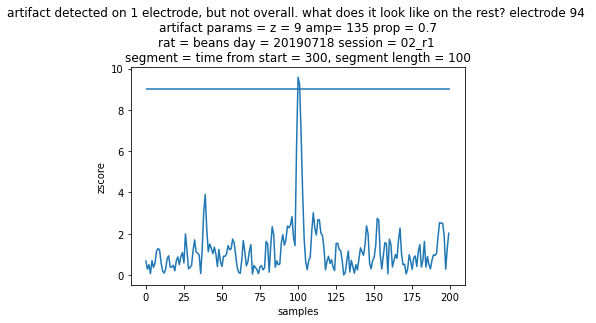

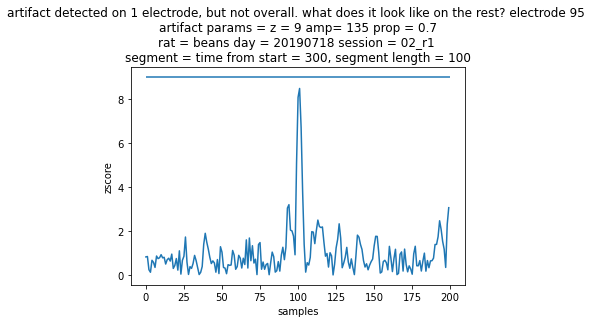

In [100]:
#visualizing what a single artifact that crossed on 1(at least) looks like on the rest of electrodes

#can change the value in data sample, for on1_not_all[___] to look at different artifacts
on1_not_all
%matplotlib inline

for ix in range((shape[0])):
    data_sample = dataz[ix,(on1_not_all[1])-100:(on1_not_all[1])+100]
    plt.figure()
    plt.plot(data_sample)
    # plt.ylim(-75,160)
    plt.hlines(zscore_thresh,0,len(data_sample))
    plt.title(f'artifact detected on 1 electrode, but not overall. what does it look like on the rest? electrode {ix} \n{artifact_params}\n{session_data}')
    plt.xlabel('samples')
    plt.ylabel('zscore')

In [93]:
on1_not_all

[1261740, 80402, 1644723, 27671, 27672]

In [98]:
#okay so its clear that even though it wasnt detected on all, it was present on many. how many does it cross? 
zscore_at_time=[]
first_on_1 = on1_not_all[1]
for ix in range(shape[0]):
    zscore_at_time.append(dataz[ix,first_on_1])

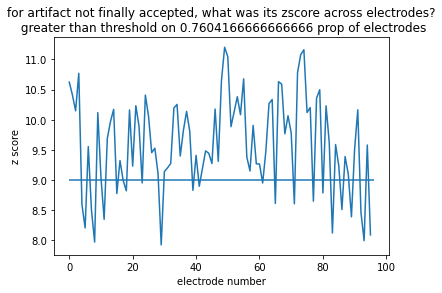

In [99]:
#for an artifact, how many electrodes did it cross thresh on? or at least what was z score?/amp?
plt.plot(zscore_at_time)
greater_than=[]
for ix in range(len(zscore_at_time)):
    greater_than.append(zscore_at_time[ix] > zscore_thresh)
plt.title(f'for artifact not finally accepted, what was its zscore across electrodes?\n greater than threshold on {sum(greater_than)/len(zscore_at_time)} prop of electrodes')
plt.xlabel('electrode number')
plt.ylabel('z score')
plt.hlines(zscore_thresh, 0, len(zscore_at_time))

In [91]:
#okay so its clear that even though it wasnt detected on all, it was on most. how many does it cross? ampliutude
amp_at_time=[]
first_on_1 = on1_not_all[1]
for ix in range(shape[0]):
    amp_at_time.append(data[ix,first_on_1])

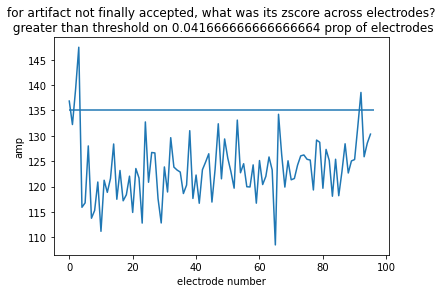

In [92]:
plt.plot(amp_at_time)
greater_than=[]
for ix in range(len(amp_at_time)):
    greater_than.append(amp_at_time[ix] > amplitude_thresh)
plt.title(f'for artifact not finally accepted, what was its zscore across electrodes?\n greater than threshold on {sum(greater_than)/len(zscore_at_time)} prop of electrodes')
plt.xlabel('electrode number')
plt.ylabel('amp')
plt.hlines(amplitude_thresh, 0, len(amp_at_time))

0.53125